# Force spectrale (PSD) par région et par stade de sommeil

Ce script parcourt le dossier `SleepRecordings` (celui utilisé par le pipeline de scoring), et pour **chaque souris** :
- si un fichier de scoring `EphyViewer_ManualScor*.csv` ou `EphyViewer_AutoScor*.csv` existe -> la souris est incluse et la PSD est calculée séparément pour Wake / NREM / REM
- sinon -> la souris est ignorée (pas de force spectrale calculée)

Les régions sont reconstruites (signaux différentiels) à partir de `DataFrame_rawdataDS.pkl` et du fichier `_LFP_coordinates_of_all_mice.csv`, comme dans le script de scoring.

### Charger les packages

In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
from scipy import signal
import os
import re
import matplotlib.pyplot as plt

%matplotlib widget

### Charger les coordonnées LFP (mêmes régions que dans le scoring)

In [3]:
all_LFPcoordinates = pd.read_csv('_LFP_coordinates_of_all_mice.csv', sep=';', index_col=0)
all_LFPcoordinates = all_LFPcoordinates.astype(str)
dpath_sleepscoring = "//10.69.168.1/crnldata/forgetting/Carla/SleepRecordings"


### Fonctions utilitaires

In [4]:
def find_regions_for_mouse(LFPs_df_mouse, mouse, all_LFPcoordinates):
    """Reconstruit les LFP différentiels par région à partir des canaux 0-31
    (déjà renommés pour une seule souris, comme sauvegardé par le script de scoring)."""
    regions = {}
    if mouse not in all_LFPcoordinates.index:
        return regions
    for idx, LFPcoord_str in enumerate(all_LFPcoordinates.loc[mouse]):
        region = all_LFPcoordinates.loc[mouse].index[idx]
        if LFPcoord_str == 'nan':
            continue
        LFPcoord = LFPcoord_str.split('_')[:2]  # les 2 premiers canaux de la région seulement
        LFP = None
        for ch_str in LFPcoord:
            ch_str = ch_str.strip()
            if ch_str == '' or not ch_str.lstrip('-').isdigit():
                continue
            ch = int(ch_str)
            if ch not in LFPs_df_mouse.columns:
                continue
            sig = np.array(LFPs_df_mouse[ch])
            LFP = sig if LFP is None else LFP - sig  # signal différentiel
        if LFP is not None:
            regions[region] = LFP
    return regions


def find_scoring_file(mouse_folder):

    manual_files = sorted(mouse_folder.glob('EphyViewer_ManualScor*.csv'))
    auto_files = sorted(mouse_folder.glob('EphyViewer_AutoScor*.csv'))
    if manual_files:
        chosen, scoring_type = manual_files[0], 'manual'
    elif auto_files:
        chosen, scoring_type = auto_files[0], 'auto'
    else:
        return None, None, None
    m = re.findall(r'\d+', chosen.stem)
    epoch_dur = int(m[-1]) if m else 5
    return chosen, epoch_dur, scoring_type


def load_scoring_file(scoring_file):

    scoring_df = pd.read_csv(scoring_file)

    if 'label' not in scoring_df.columns:
        # probablement un fichier enregistré avec ';' comme séparateur (ex: réédité dans Excel FR)
        scoring_df = pd.read_csv(scoring_file, sep=';')

    if 'label' not in scoring_df.columns and 'name' in scoring_df.columns:
        scoring_df = scoring_df.rename(columns={'name': 'label'})

    if 'label' not in scoring_df.columns:
        raise ValueError(f"colonne 'label' introuvable (colonnes trouvées : {list(scoring_df.columns)})")

    if 'time' not in scoring_df.columns or 'duration' not in scoring_df.columns:
        raise ValueError(f"colonne 'time' ou 'duration' introuvable (colonnes trouvées : {list(scoring_df.columns)})")

    if scoring_df.empty:
        raise ValueError("fichier de scoring vide (0 épisode)")

    return scoring_df


def get_episodes(scoring_df, min_duration_sec=15):
    """Regroupe les epochs consécutifs de même label (lignes du scoring, en
    général de quelques secondes chacune) en épisodes continus (bouts).

    Un épisode = une suite ininterrompue d'epochs portant le même label.
    Seuls les épisodes dont la durée totale est >= min_duration_sec sont
    gardés ; les épisodes plus courts sont exclus.

    Retourne un DataFrame avec les colonnes : label, start, stop, duration.
    """
    df = scoring_df.sort_values('time').reset_index(drop=True)
    block_id = (df['label'] != df['label'].shift()).cumsum()

    episodes = []
    for _, block in df.groupby(block_id):
        start = block['time'].iloc[0]
        stop = (block['time'] + block['duration']).iloc[-1]
        episodes.append({
            'label': block['label'].iloc[0],
            'start': start,
            'stop': stop,
            'duration': stop - start,
        })

    episodes_df = pd.DataFrame(episodes, columns=['label', 'start', 'stop', 'duration'])
    return episodes_df[episodes_df['duration'] >= min_duration_sec].reset_index(drop=True)


def compute_psd_by_stage(region_signal, samplerate, scoring_df, stages=('Wake_1', 'NREM_2', 'REM_3'),
                          win_sec=4, min_episode_sec=15):
    """Calcule la PSD (Welch, en puissance linéaire, pas en dB/log) séparément
    pour chaque stade de sommeil.

    Étapes :
    1. les epochs consécutifs de même stade sont regroupés en épisodes continus (bouts)
    2. les épisodes plus courts que min_episode_sec sont exclus
    3. les épisodes gardés sont mis bout à bout (concaténés)
    4. la PSD est calculée UNE SEULE FOIS sur ce signal concaténé
       (et non épisode par épisode, avec moyenne ensuite)
    """
    nperseg = int(win_sec * samplerate)
    n_samples = len(region_signal)

    episodes_df = get_episodes(scoring_df, min_duration_sec=min_episode_sec)

    results = {}
    if episodes_df.empty:
        return results

    for stage in stages:
        stage_episodes = episodes_df[episodes_df['label'] == stage]
        if stage_episodes.empty:
            continue

        segments = []
        for _, ep in stage_episodes.iterrows():
            start = int(ep['start'] * samplerate)
            stop = int(ep['stop'] * samplerate)
            stop = min(stop, n_samples)
            if stop > start:
                segments.append(region_signal[start:stop])
        if not segments:
            continue

        concatenated = np.concatenate(segments)
        if len(concatenated) < nperseg:
            continue  # pas assez de données concaténées pour un seul segment Welch

        freqs, psd = signal.welch(concatenated, fs=samplerate, nperseg=nperseg, noverlap=nperseg // 2)
        results[stage] = (freqs, psd)  # psd en échelle de puissance linéaire

    return results


### Calculer la PSD pour toutes les souris scorées


In [7]:
samplerate = 1000
stages = ['Wake_1', 'NREM_2', 'REM_3']
win_sec = 1
min_episode_sec = 15  # épisodes (bouts continus d'un même stade) plus courts -> exclus

base_folder = Path(dpath_sleepscoring)
all_results = []
included_mice = []
skipped_mice = []
PSD_nested = {}  # PSD_nested[mouse][mouse_age][region][stage] = (freqs, psd)

for lfp_file in sorted(base_folder.glob('**/DataFrame_rawdataDS.pkl')):
    mouse_folder = lfp_file.parent
    mouse = mouse_folder.parent.name   # structure attendue : SleepRecordings/{mouse}/{mouse_age}/
    mouse_age = mouse_folder.name

    scoring_file, epoch_dur, scoring_type = find_scoring_file(mouse_folder)
    if scoring_file is None:
        print(f"/!/ {mouse} ({mouse_age}) : pas de fichier de scoring -> ignorée")
        skipped_mice.append(mouse)
        continue

    try:
        scoring_df = load_scoring_file(scoring_file)
    except (ValueError, pd.errors.EmptyDataError) as e:
        print(f"/!\\ {mouse} ({mouse_age}) : fichier de scoring illisible ({scoring_file.name}) -> ignorée ({e})")
        skipped_mice.append(mouse)
        continue

    print(f"{mouse} ({mouse_age}) : scoring {scoring_type} trouvé ({scoring_file.name})")

    LFPs_df_mouse = pd.read_pickle(lfp_file)

    regions = find_regions_for_mouse(LFPs_df_mouse, mouse, all_LFPcoordinates)
    if not regions:
        print(f"/!/ {mouse} : aucune région trouvée dans '_LFP_coordinates_of_all_mice.csv' -> ignorée")
        skipped_mice.append(mouse)
        continue

    included_mice.append(mouse)
    PSD_nested.setdefault(mouse, {}).setdefault(mouse_age, {})
    for region, region_signal in regions.items():
        if region == 'EMG':
            continue  # pas de force spectrale sur l'EMG
        psd_by_stage = compute_psd_by_stage(region_signal, samplerate, scoring_df, stages=stages,
                                             win_sec=win_sec, min_episode_sec=min_episode_sec)
        PSD_nested[mouse][mouse_age][region] = psd_by_stage
        for stage, (freqs, psd) in psd_by_stage.items():
            for f, p in zip(freqs, psd):
                all_results.append({
                    'mouse': mouse, 'mouse_age': mouse_age, 'region': region,
                    'stage': stage, 'freq': f, 'power': p, 'scoring_type': scoring_type
                })

PSD_df = pd.DataFrame(all_results)
print(f"\n{len(included_mice)} souris incluses : {included_mice}")
print(f"{len(skipped_mice)} souris ignorées (pas de scoring / scoring illisible) : {skipped_mice}")


CarreBlanc (3mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
CarreBlanc (4mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
CarreBlanc (5mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
CarreBlanc (6mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
/!/ CarreBlanc (7mois) : pas de fichier de scoring -> ignorée
CarreJaune (3mois) : scoring auto trouvé (EphyViewer_AutoScor5.csv)
CarreJaune (4mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
CarreJaune (5mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
CarreJaune (6mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
/!/ CarreJaune (7mois) : pas de fichier de scoring -> ignorée
CarreMarron (3mois) : scoring auto trouvé (EphyViewer_AutoScor5.csv)
CarreMarron (4mois) : scoring auto trouvé (EphyViewer_AutoScor5.csv)
CarreMarron (5mois) : scoring auto trouvé (EphyViewer_AutoScor5.csv)
CarreMarron (6mois) : scoring manual trouvé (EphyViewer_ManualScor5.csv)
CarreMarron (7mois) : sc

### Tableau

In [8]:
mouse_info = pd.read_csv('_MouseID_ImplantColorCode.csv', sep=';')

# Nettoyage : espaces superflus autour des valeurs texte, et 'Nan' textuel -> vraie valeur manquante
mouse_info = mouse_info.apply(lambda col: col.str.strip() if col.dtype == 'object' else col)
mouse_info = mouse_info.replace('Nan', np.nan)
mouse_info['Virus'] = mouse_info['Virus'].replace({'cHR2': 'Chr2'})  # harmonise la casse (cHR2 -> Chr2)

# PSD_df['mouse'] est construit à partir du nom de dossier = nom d'Implant
PSD_df = PSD_df.merge(mouse_info, left_on='mouse', right_on='Implant', how='left')
PSD_df = PSD_df.drop(columns=['Implant'])  # redondant avec la colonne 'mouse'

missing = PSD_df.loc[PSD_df['MouseID'].isna(), 'mouse'].unique()
if len(missing):
    print(f"/!\\ Implant(s) non trouvé(s) dans _MouseID_ImplantColorCode.csv : {list(missing)}")

PSD_df.head()

output_csv = base_folder / 'PSD_by_region_stage.csv'
PSD_df.to_csv(output_csv, index=False)


### Un graphe par souris : évolution de la force spectrale par mois/âge


Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreBlanc\PSD_power_CarreBlanc_0-30Hz.png


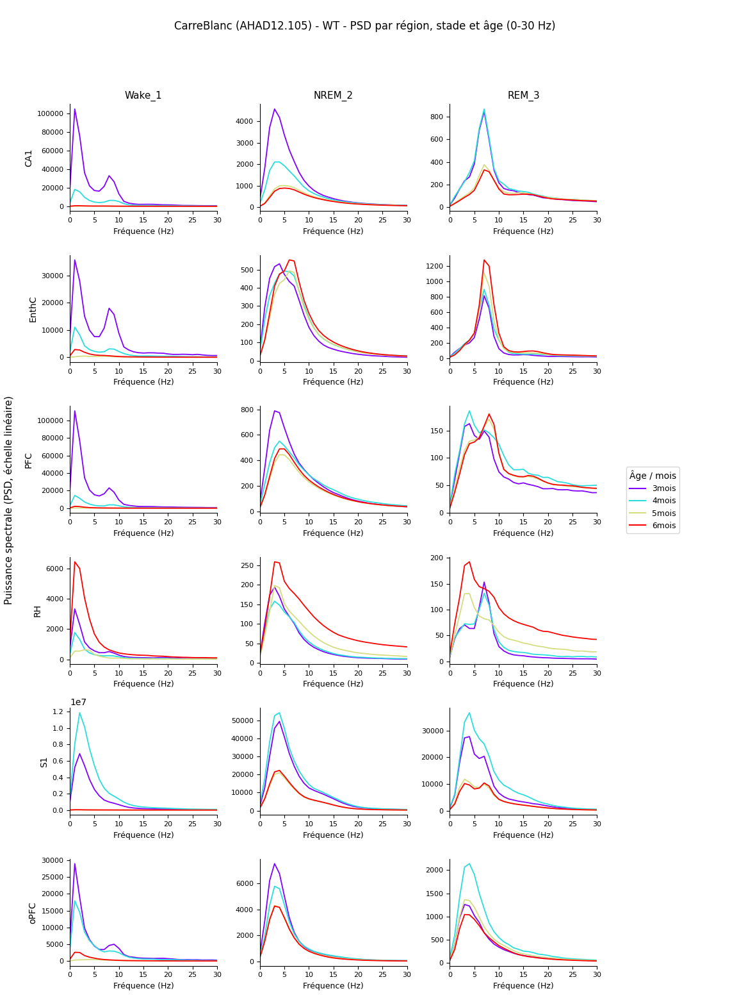

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreJaune\PSD_power_CarreJaune_0-30Hz.png


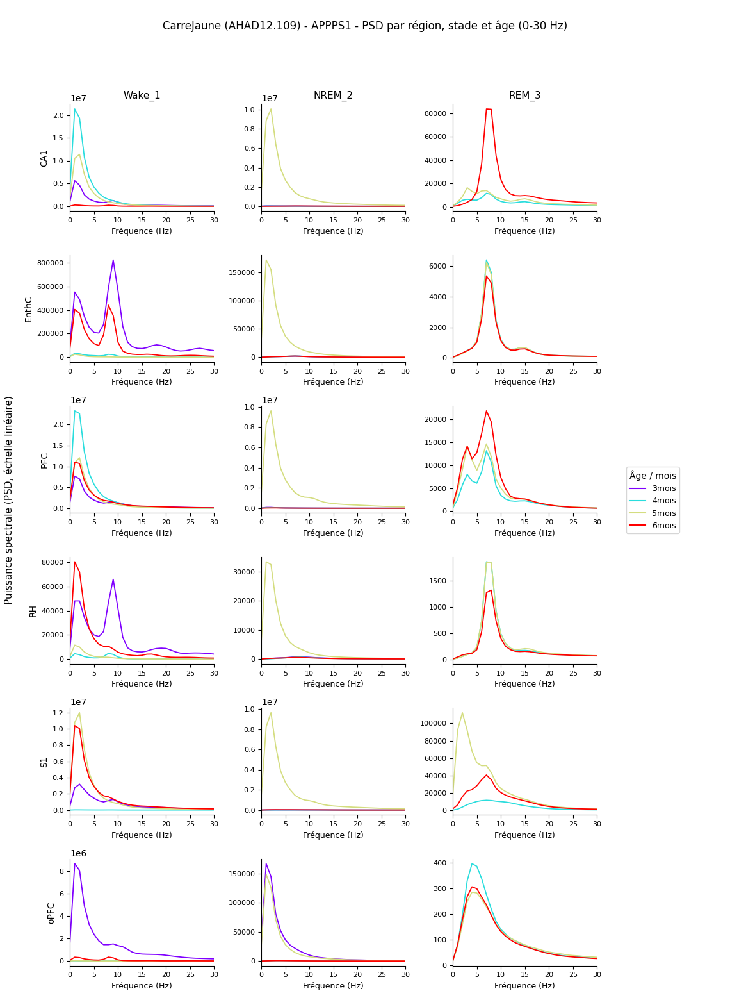

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreMarron\PSD_power_CarreMarron_0-30Hz.png


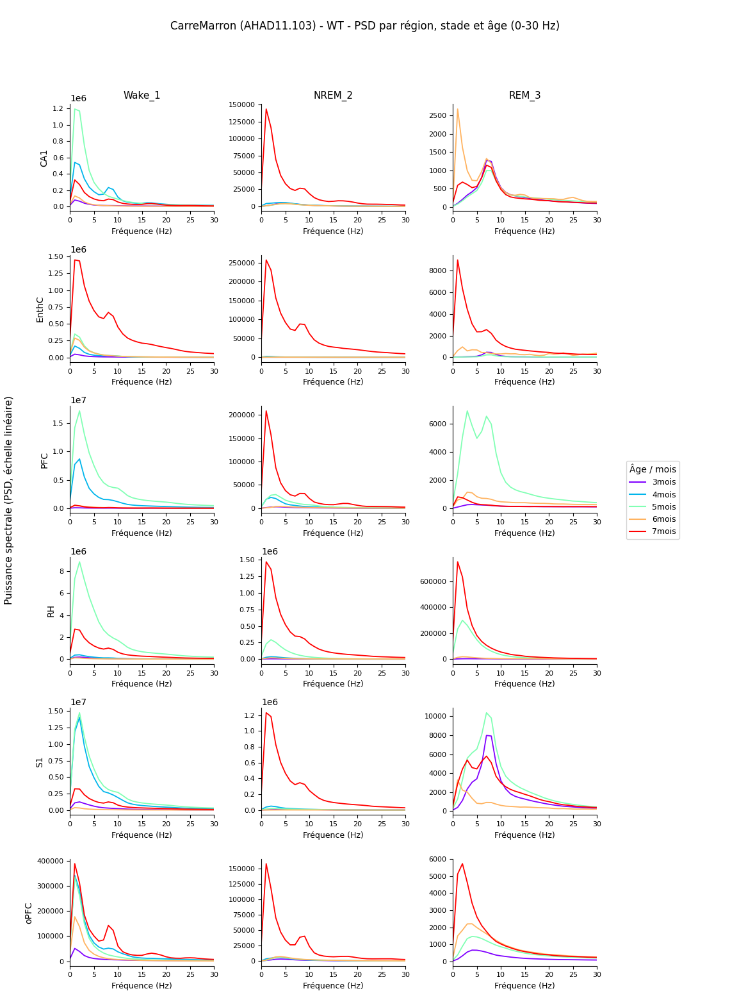

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreNoir\PSD_power_CarreNoir_0-30Hz.png


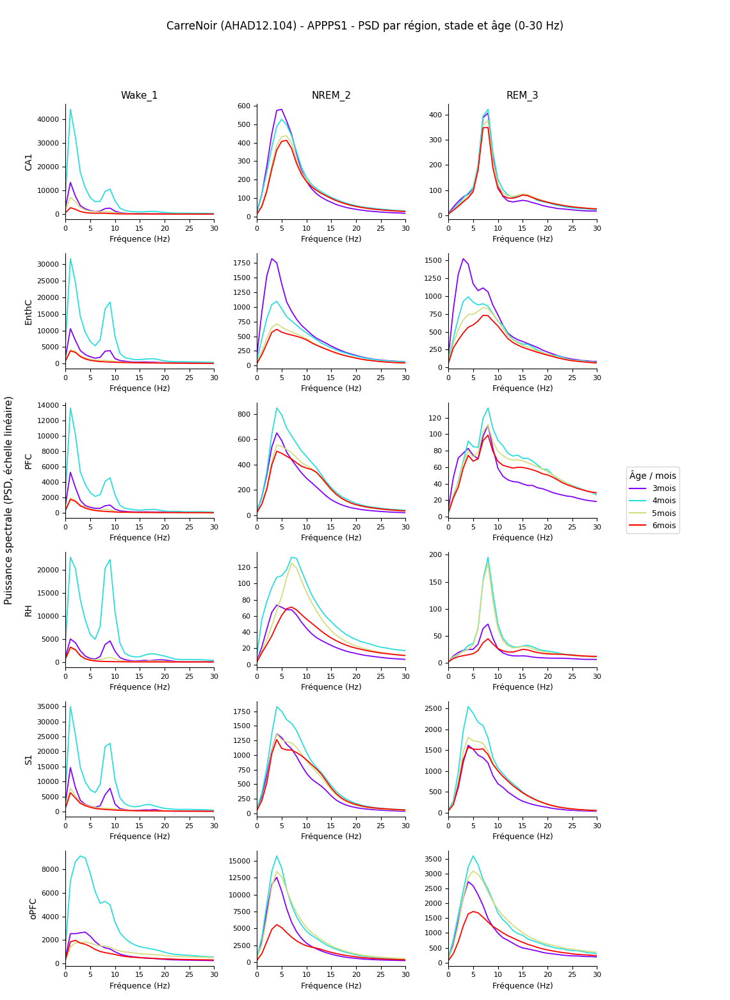

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreOrange\PSD_power_CarreOrange_0-30Hz.png


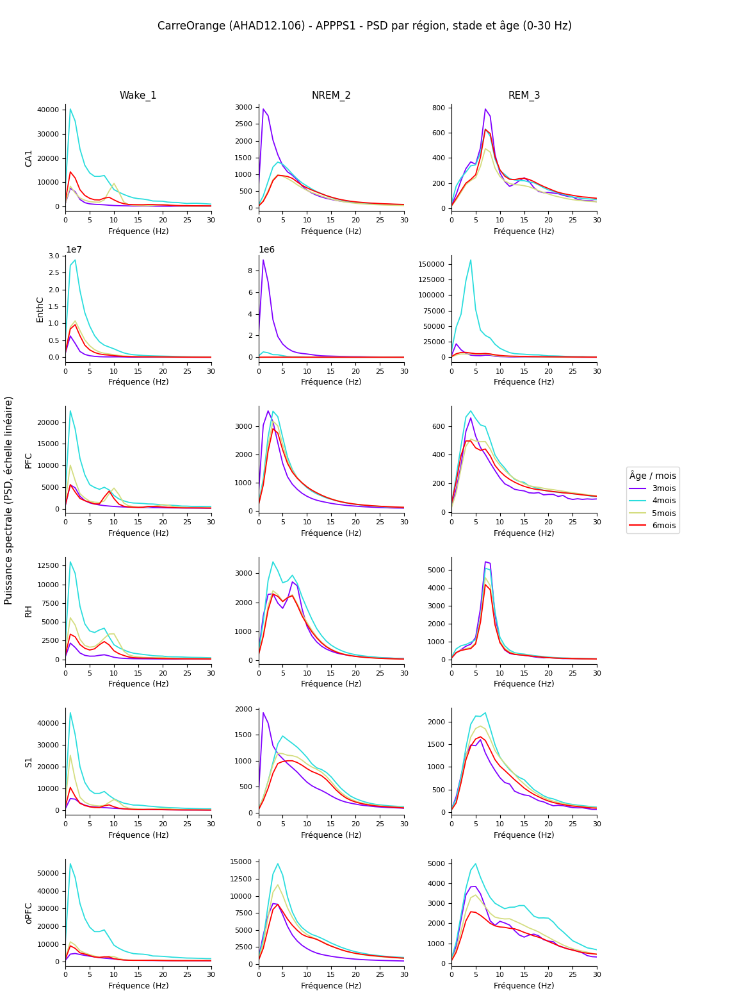

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreRouge\PSD_power_CarreRouge_0-30Hz.png


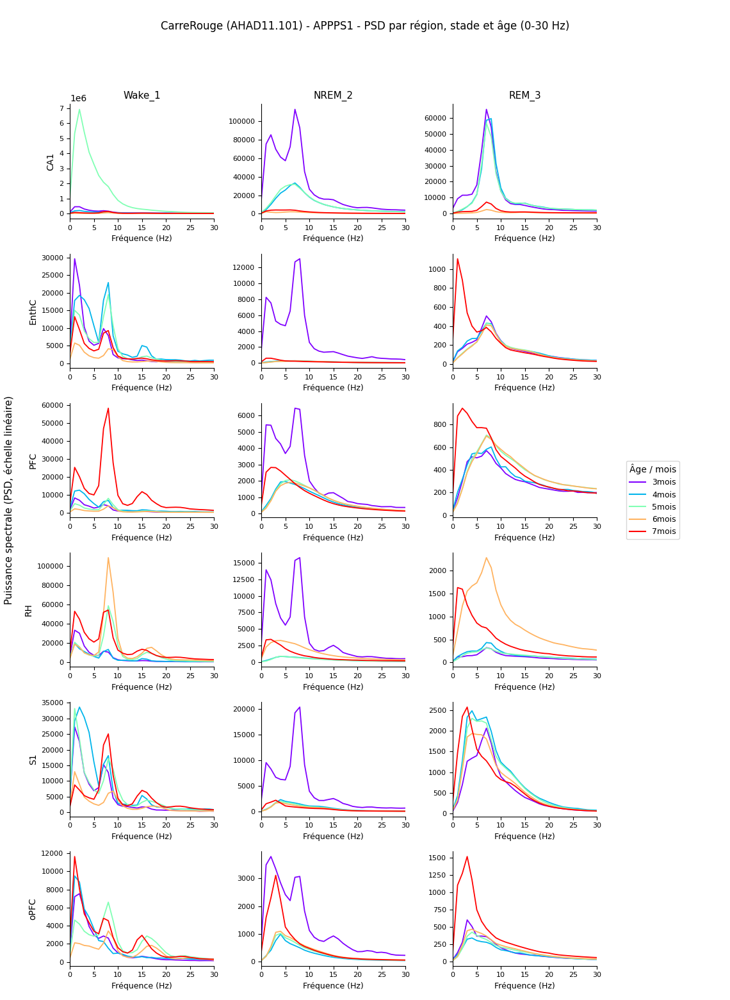

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreVert\PSD_power_CarreVert_0-30Hz.png


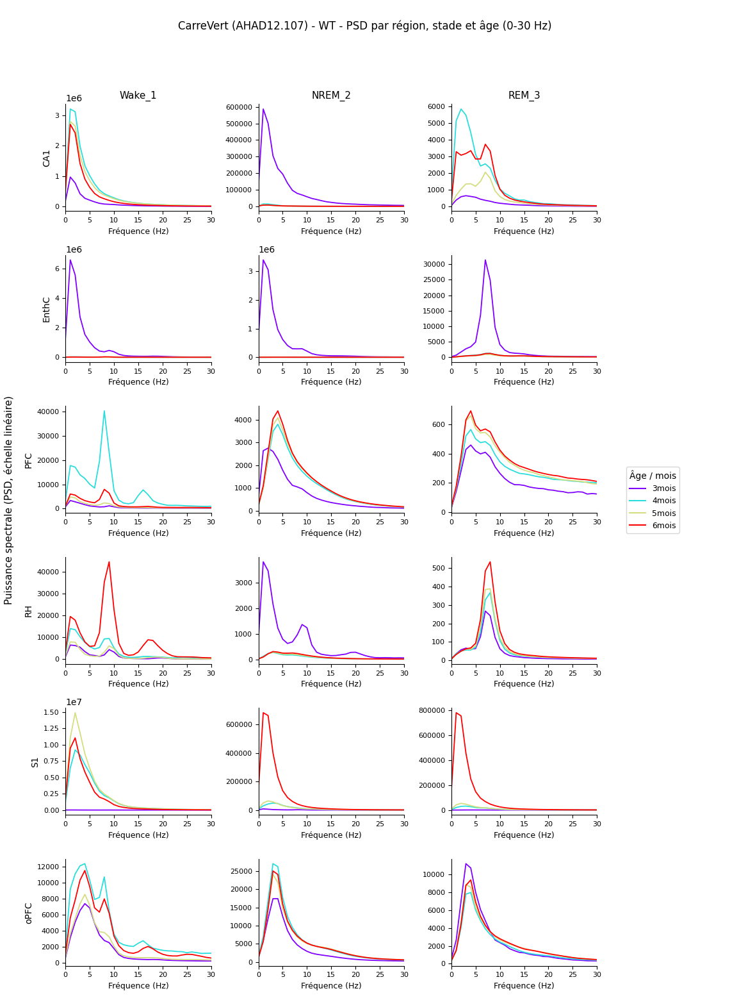

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\CarreViolet\PSD_power_CarreViolet_0-30Hz.png


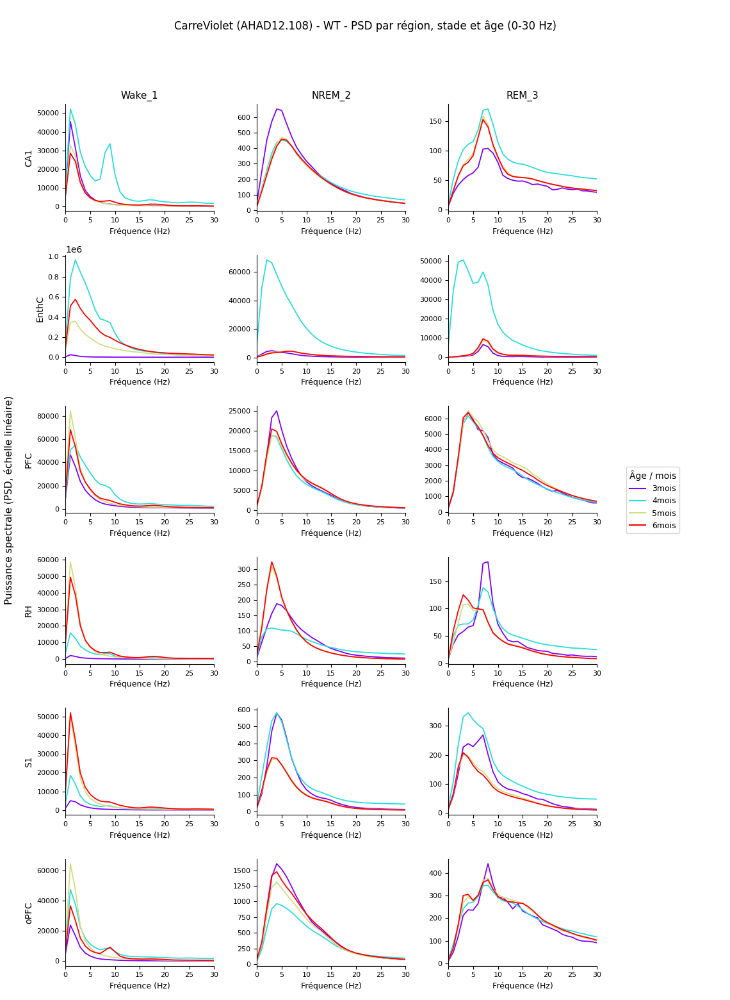

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondBleu\PSD_power_RondBleu_0-30Hz.png


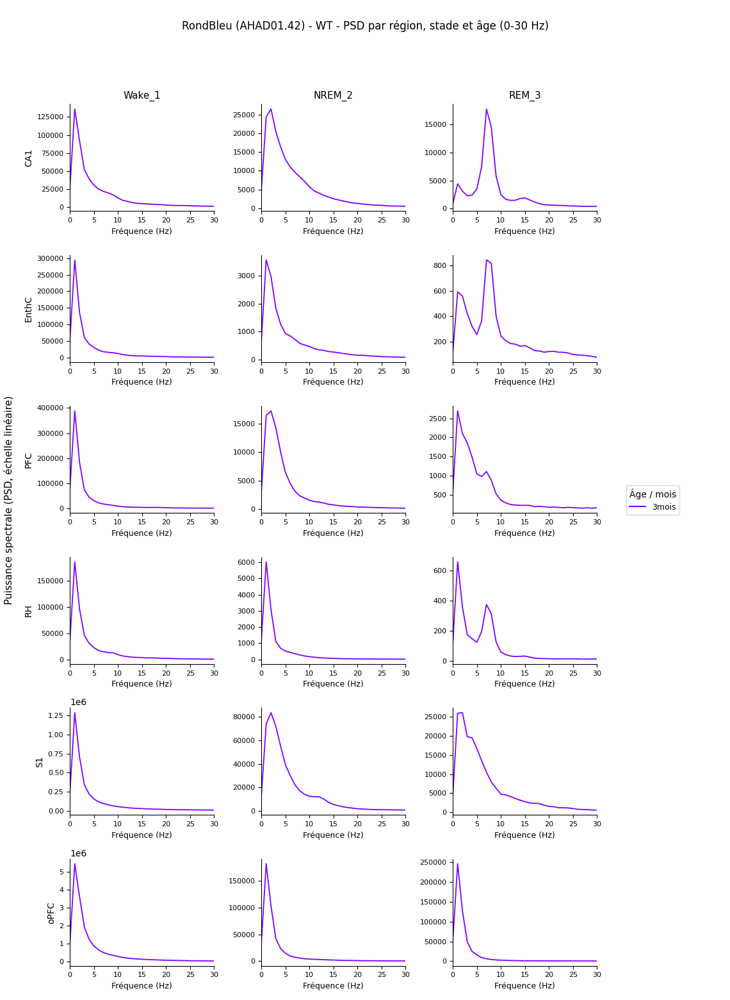

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondJaune\PSD_power_RondJaune_0-30Hz.png


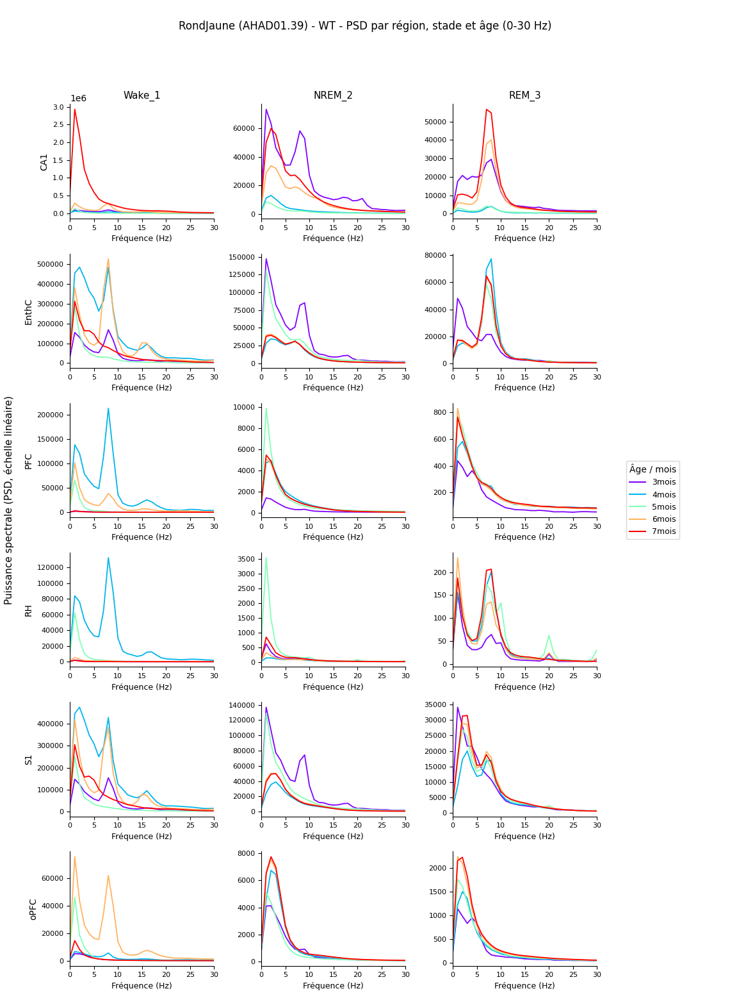

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondMarron\PSD_power_RondMarron_0-30Hz.png


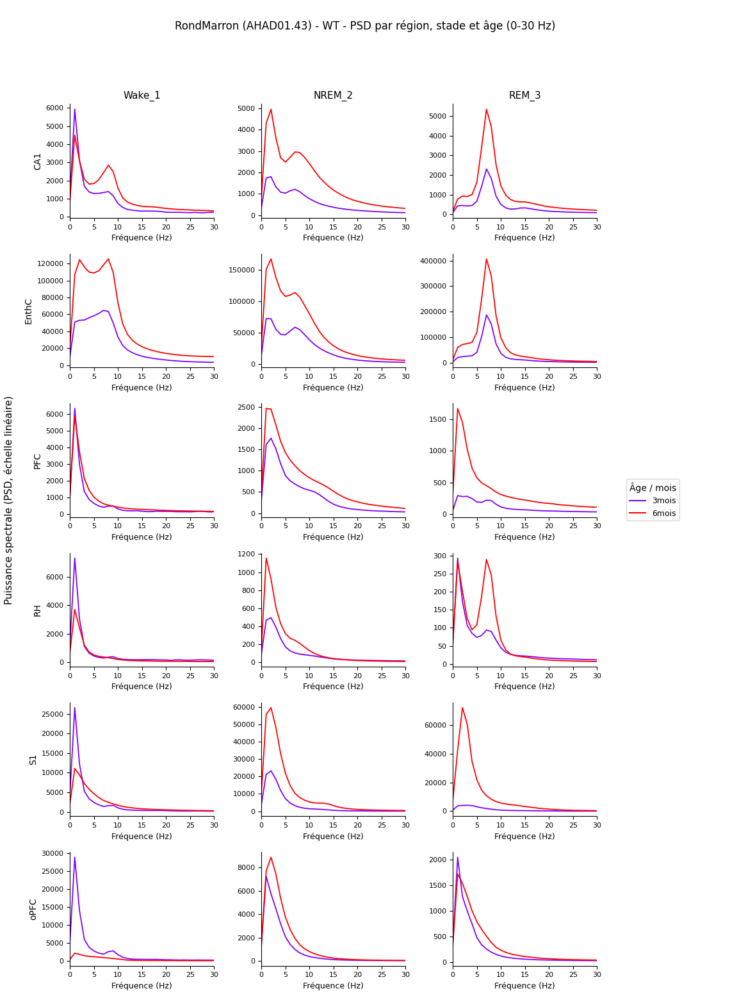

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondNoir\PSD_power_RondNoir_0-30Hz.png


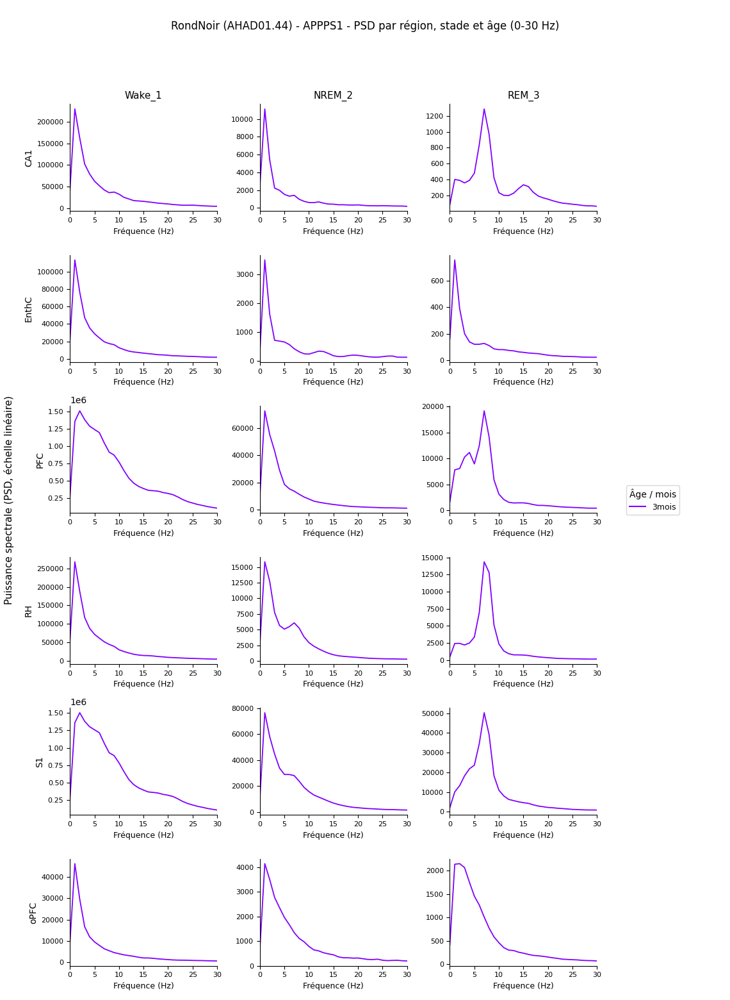

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondOrange\PSD_power_RondOrange_0-30Hz.png


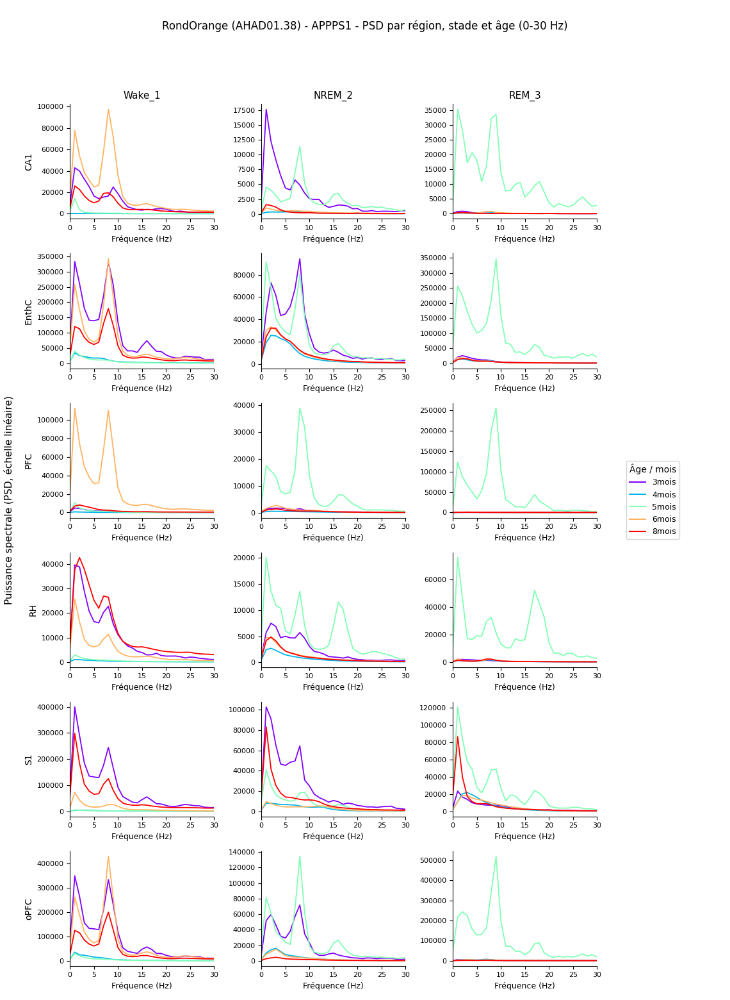

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondRouge\PSD_power_RondRouge_0-30Hz.png


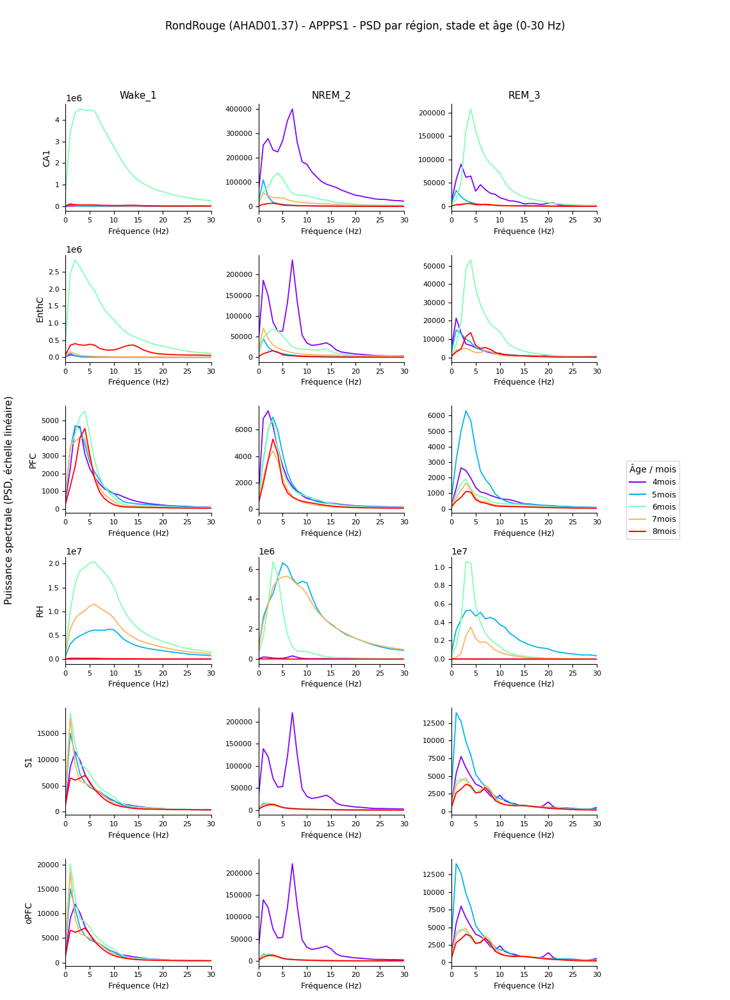

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondVert\PSD_power_RondVert_0-30Hz.png


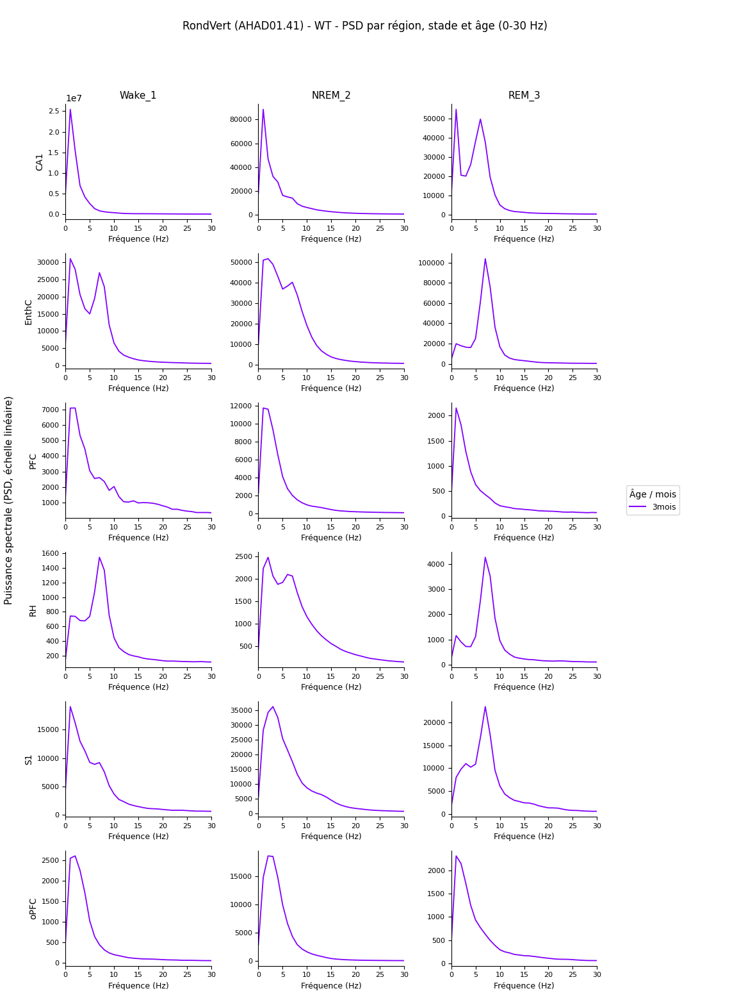

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\RondViolet\PSD_power_RondViolet_0-30Hz.png


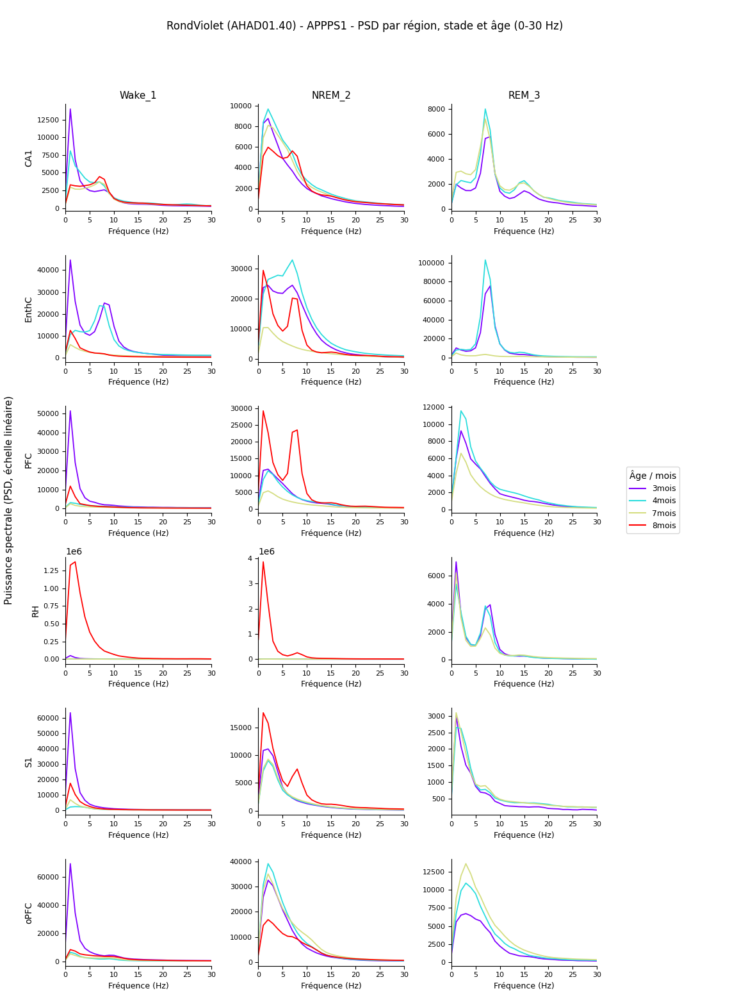

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TraitRouge\PSD_power_TraitRouge_0-30Hz.png


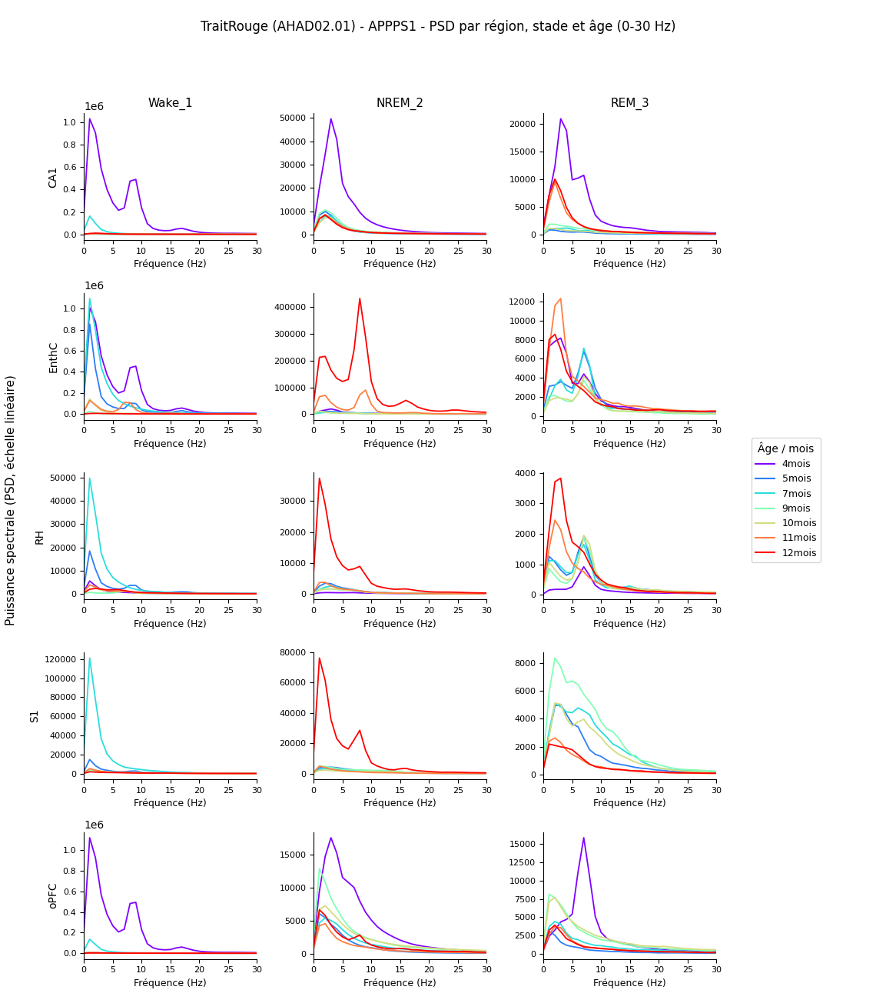

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TraitVert\PSD_power_TraitVert_0-30Hz.png


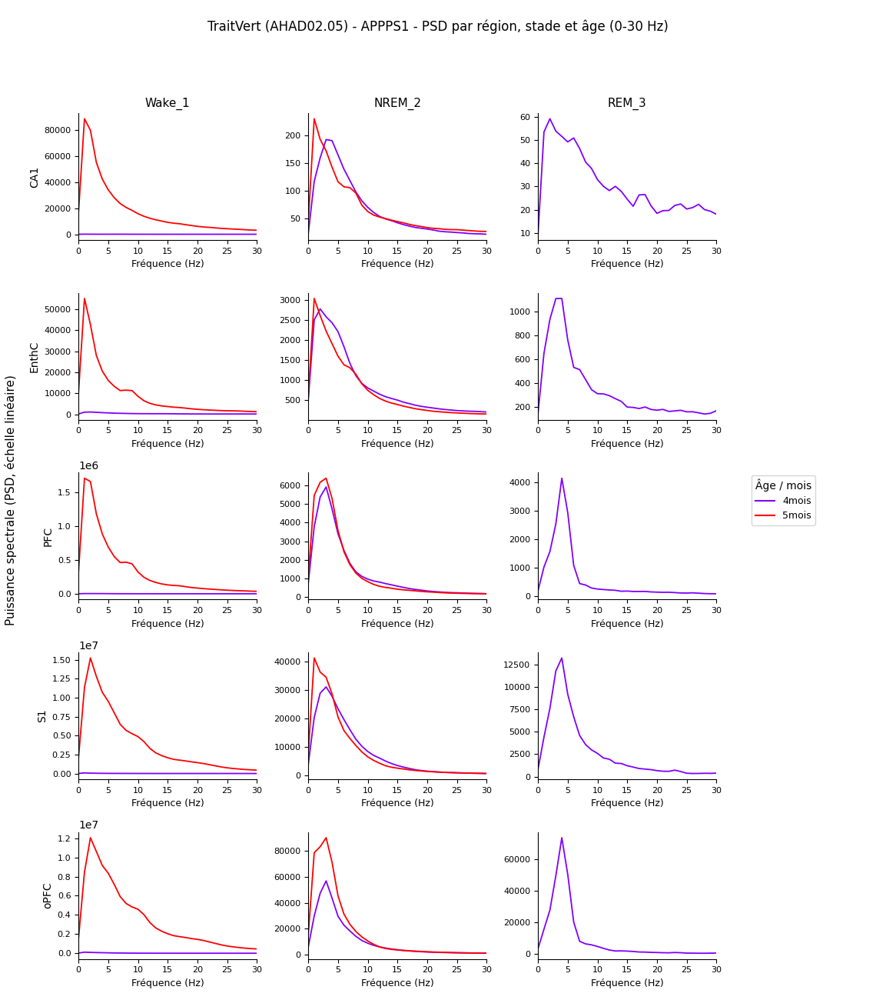

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TraitViolet\PSD_power_TraitViolet_0-30Hz.png


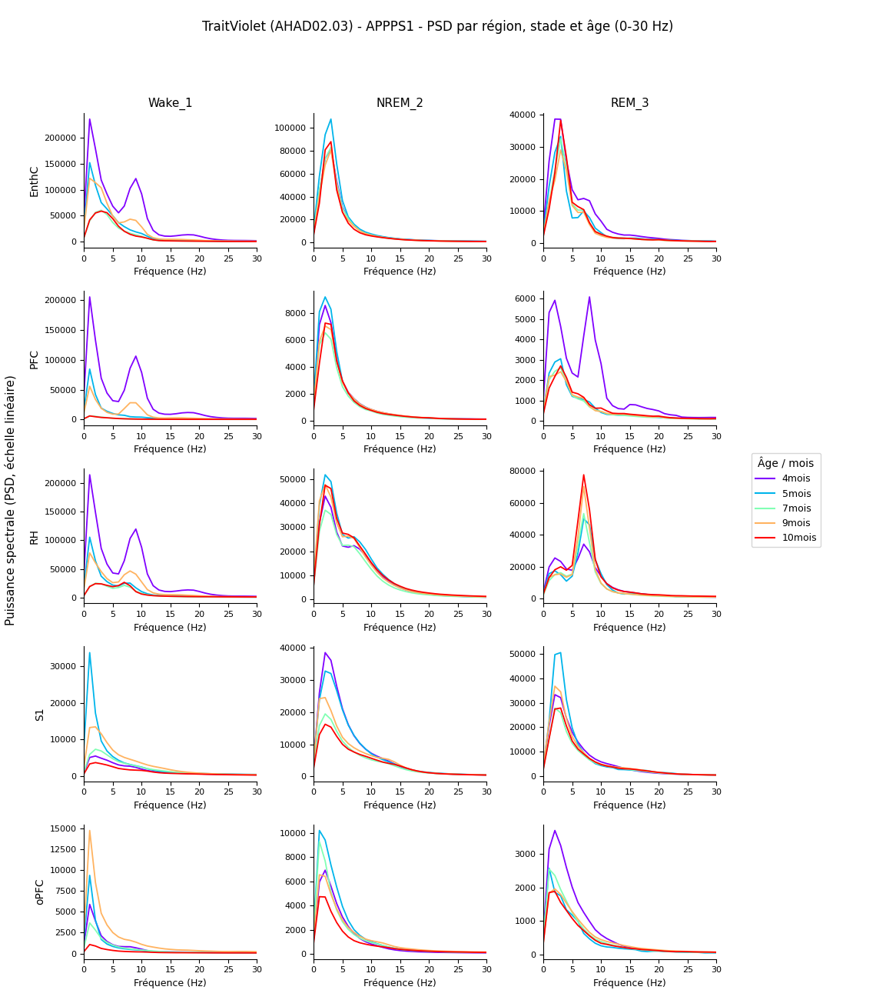

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleBlanc\PSD_power_TriangleBlanc_0-30Hz.png


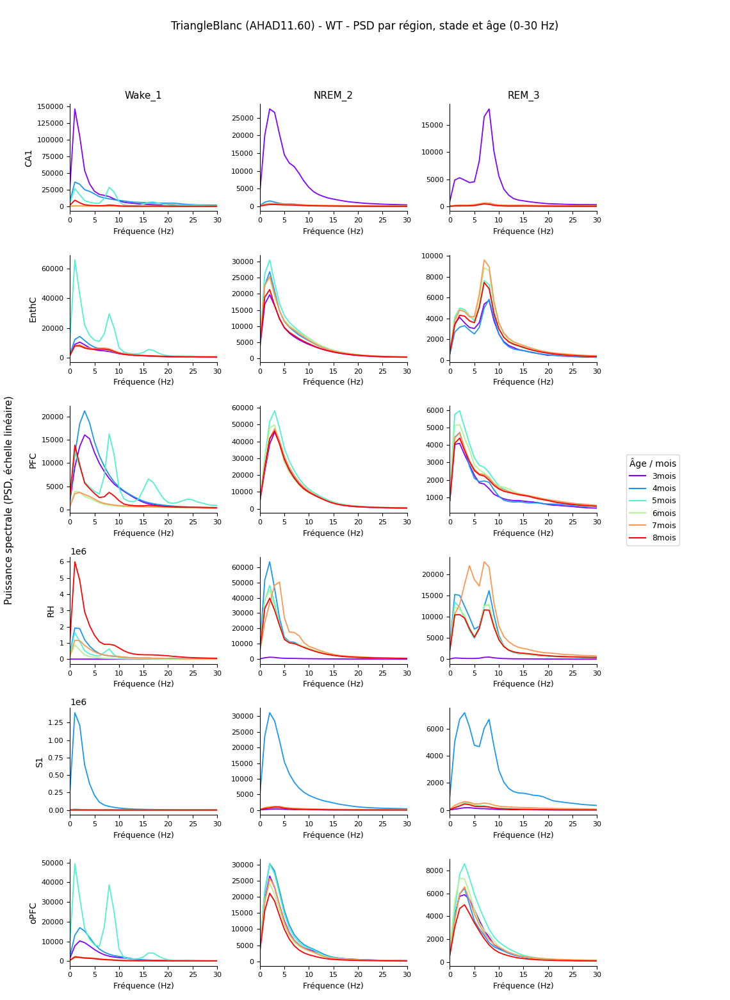

C:\Users\AudreyHay\AppData\Local\Temp\ipykernel_52132\211403088.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(


Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleBleu\PSD_power_TriangleBleu_0-30Hz.png


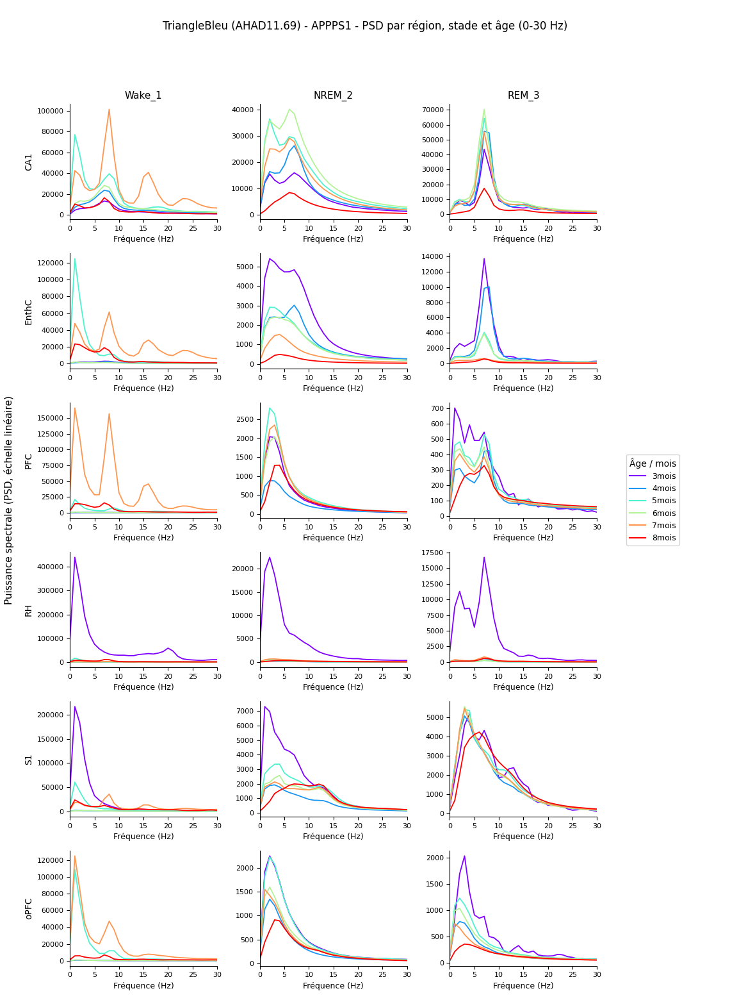

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleJaune\PSD_power_TriangleJaune_0-30Hz.png


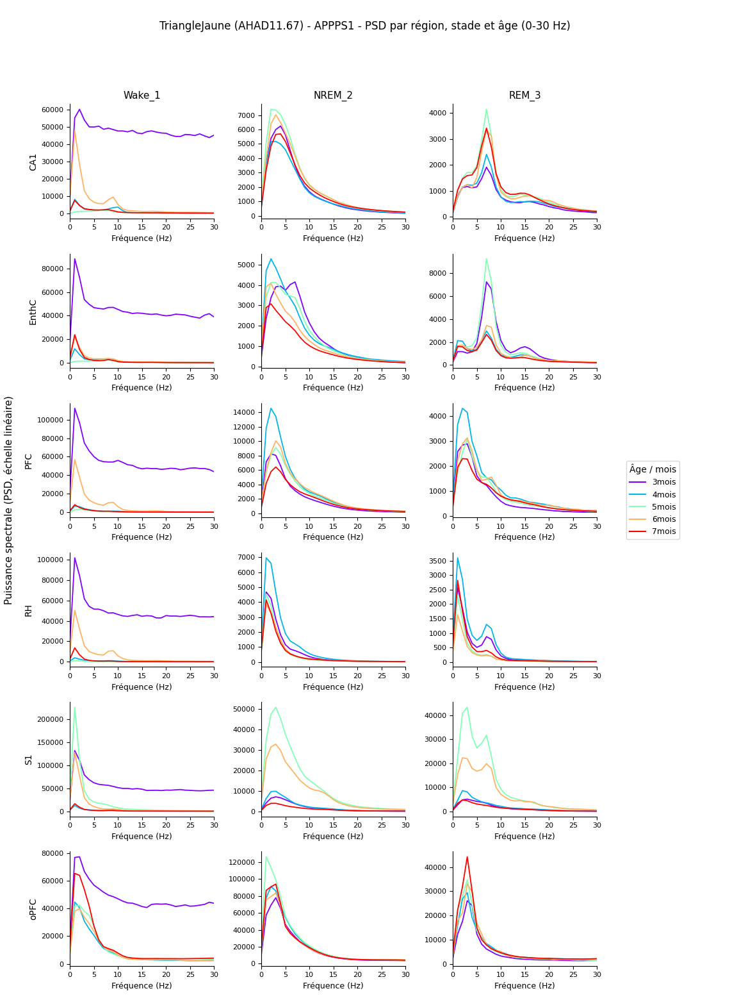

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleMarron\PSD_power_TriangleMarron_0-30Hz.png


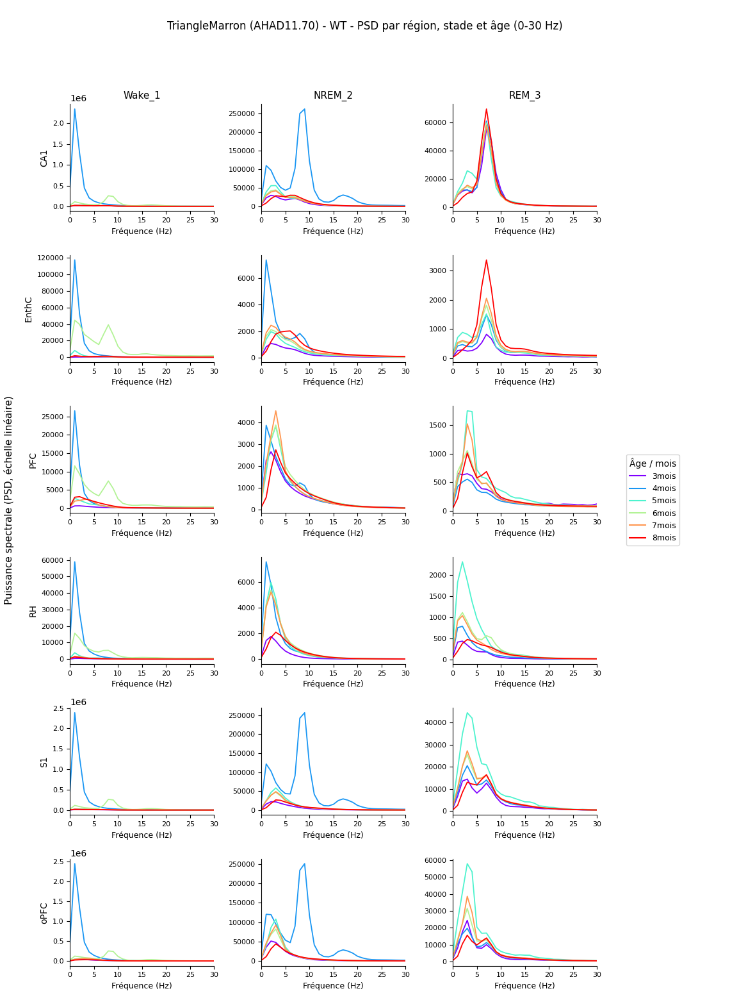

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleNoir\PSD_power_TriangleNoir_0-30Hz.png


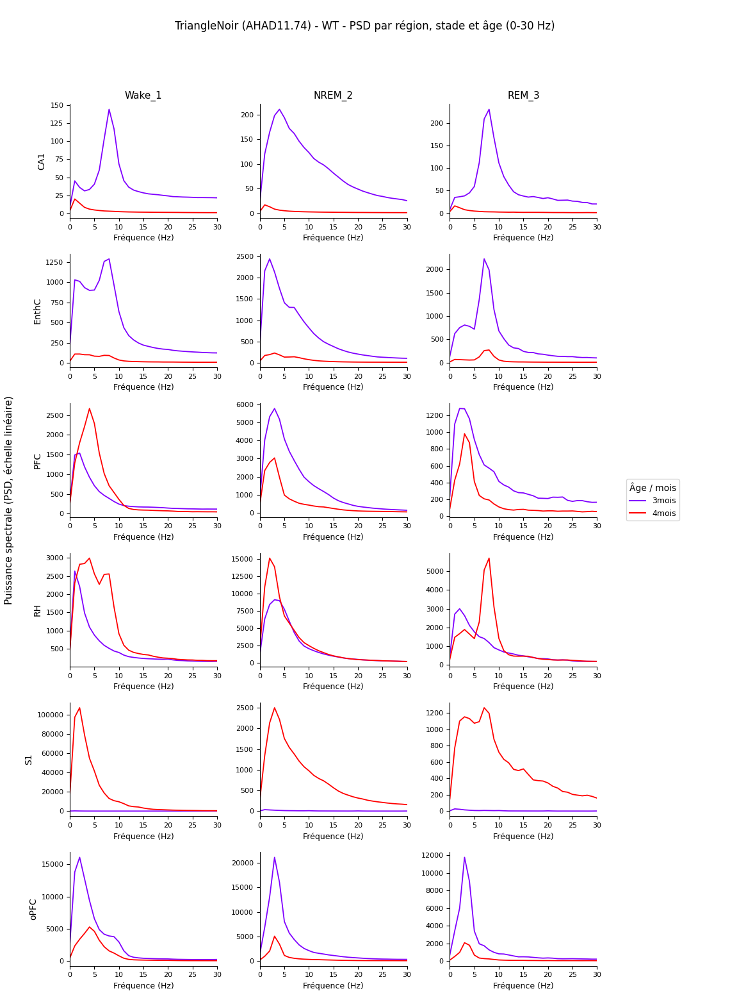

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleOrange\PSD_power_TriangleOrange_0-30Hz.png


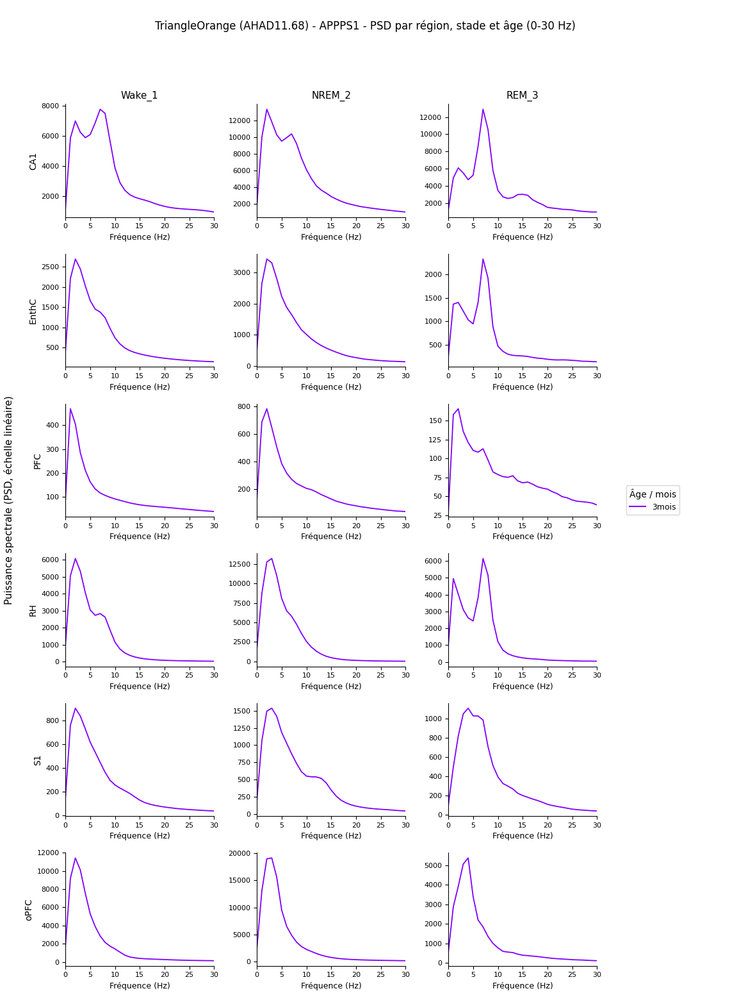

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleRouge\PSD_power_TriangleRouge_0-30Hz.png


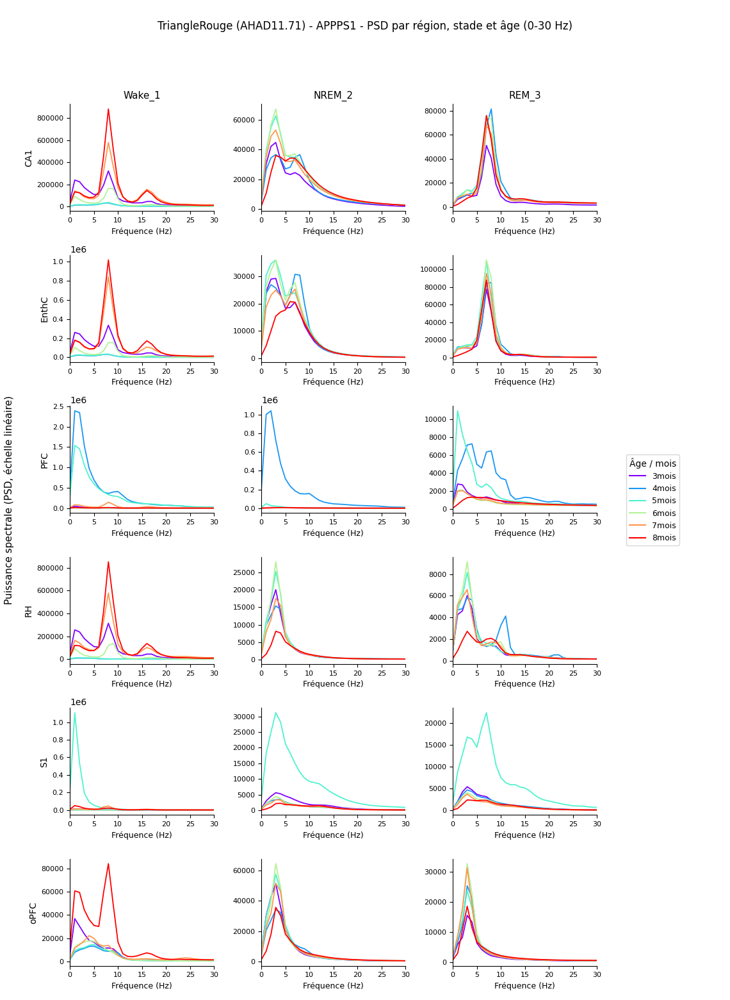

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleVert\PSD_power_TriangleVert_0-30Hz.png


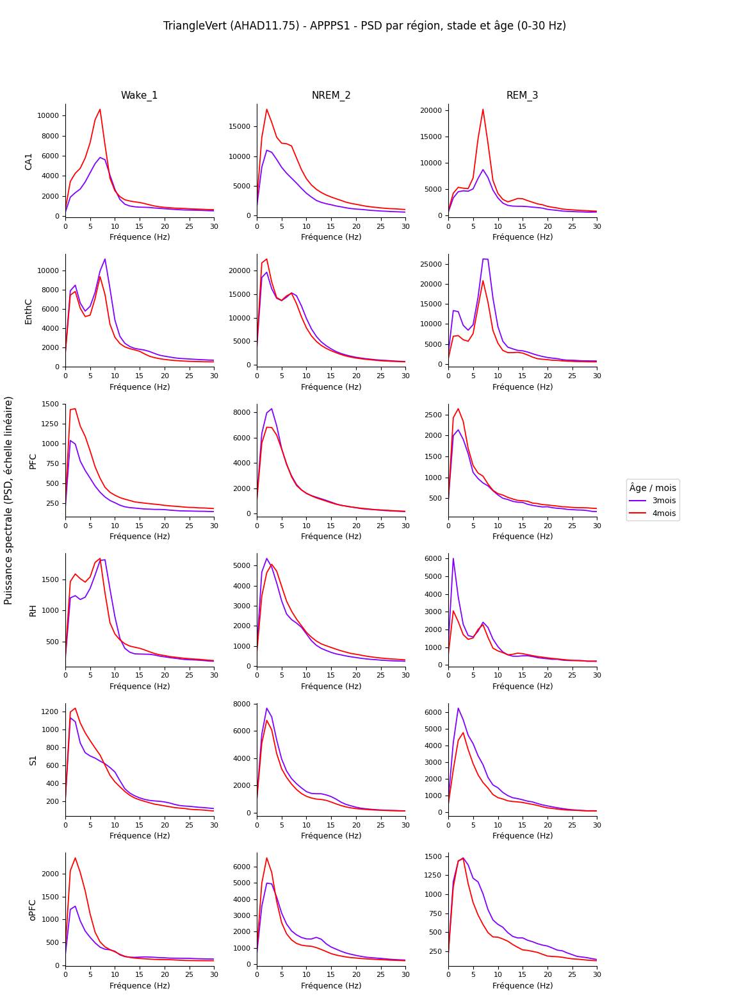

Figure sauvegardée : \\10.69.168.1\crnldata\forgetting\Carla\SleepRecordings\TriangleViolet\PSD_power_TriangleViolet_0-30Hz.png


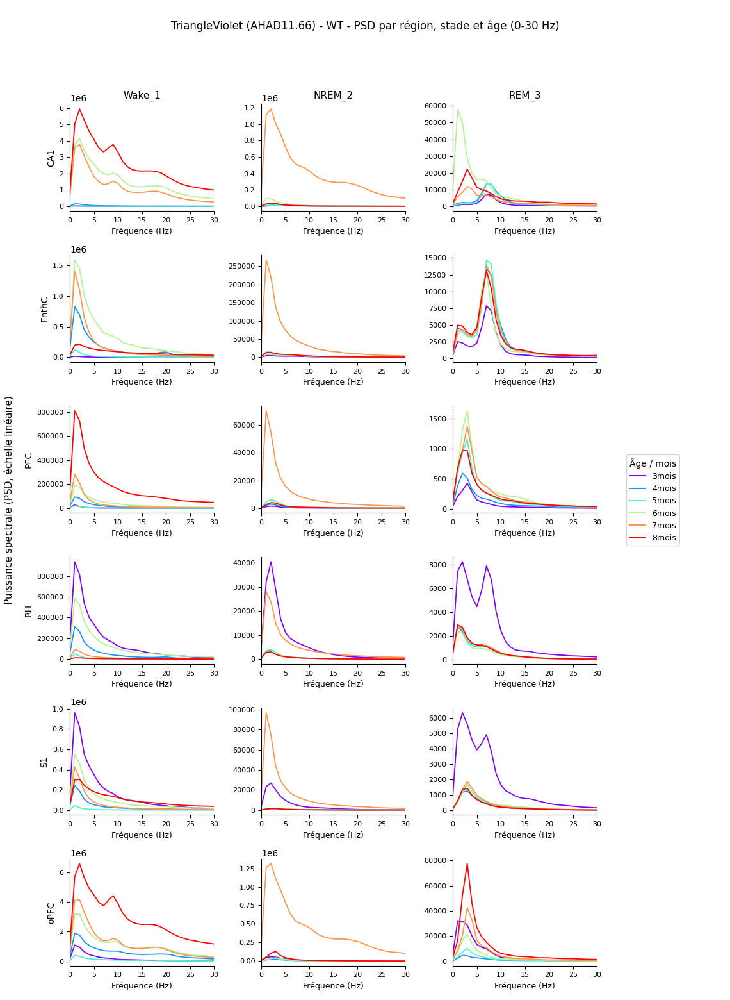

In [9]:
import re as _re

def age_sort_key(age_str):
    m = _re.search(r'\d+', age_str)
    return (0, int(m.group())) if m else (1, age_str)


genotype_map = PSD_df.drop_duplicates('mouse').set_index('mouse')['Genotype'].to_dict()
if 'MouseID' in PSD_df.columns:
    mouseid_map = PSD_df.drop_duplicates('mouse').set_index('mouse')['MouseID'].to_dict()
else:
    mouseid_map = {}

save_figures = True
fmax_plot = 30  # Hz

for mouse, ages_dict in PSD_nested.items():
    ages_sorted = sorted(ages_dict.keys(), key=age_sort_key)
    regions_list = sorted({region for age in ages_dict.values() for region in age.keys()})
    if not regions_list:
        continue

    genotype = genotype_map.get(mouse, 'Genotype inconnu')
    mouse_id = mouseid_map.get(mouse, None)
    title_mouse = f"{mouse}" + (f" ({mouse_id})" if mouse_id and mouse_id != mouse else "")

    month_colors = plt.cm.rainbow(np.linspace(0, 1, len(ages_sorted)))
    color_by_age = dict(zip(ages_sorted, month_colors))

    # largeur réservée à droite pour la légende des âges (fixe, en pouces)
    legend_width = 1.8
    plot_width = 3.2 * len(stages)
    fig_width = plot_width + legend_width
    fig_height = 2.6 * len(regions_list)
    plot_frac = plot_width / fig_width  # fraction de la figure occupée par les graphes

    fig, axs = plt.subplots(
        len(regions_list), len(stages),
        figsize=(fig_width, fig_height),
        squeeze=False,
        sharex=False,   # chaque graphe garde ses propres graduations
        sharey=False,
    )

    for row, region in enumerate(regions_list):
        for col, stage in enumerate(stages):
            ax = axs[row][col]
            for age in ages_sorted:
                region_data = ages_dict[age].get(region)
                if not region_data or stage not in region_data:
                    continue
                freqs, psd = region_data[stage]
                mask = freqs <= fmax_plot
                ax.plot(freqs[mask], psd[mask], color=color_by_age[age], lw=1.3, label=age)

            ax.set_xlim(0, fmax_plot)
            ax.tick_params(axis='both', which='major', labelsize=8)

            if row == 0:
                ax.set_title(stage, fontsize=11)
            if col == 0:
                ax.set_ylabel(region, fontsize=10)
            ax.set_xlabel('Fréquence (Hz)', fontsize=9)

            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

    fig.text(0.005, 0.5, 'Puissance spectrale (PSD, échelle linéaire)', va='center', rotation='vertical', fontsize=11)

    handles = [plt.Line2D([0], [0], color=color_by_age[age], label=age) for age in ages_sorted]
    ncol_legend = 1 if len(ages_sorted) <= 12 else 2
    fig.legend(handles=handles, loc='center left', bbox_to_anchor=(plot_frac + 0.01, 0.5),
               title='Âge / mois', fontsize=9, ncol=ncol_legend)

    fig.suptitle(f'{title_mouse} - {genotype} - PSD par région, stade et âge (0-{fmax_plot} Hz)', fontsize=12)
    plt.tight_layout(rect=[0.02, 0, plot_frac - 0.005, 0.94])

    if save_figures:
        out_path = base_folder / mouse / f'PSD_power_{mouse}_0-{fmax_plot}Hz.png'
        out_path.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f'Figure sauvegardée : {out_path}')

    plt.show()